# HOURLY FORECASTING

## imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
color_pal = sns.color_palette()
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.naive import NaiveForecaster
from sktime.forecasting.exp_smoothing import ExponentialSmoothing
from sktime.forecasting.arima import AutoARIMA
from sktime.forecasting.arima import ARIMA
from sktime.forecasting.model_selection import ExpandingWindowSplitter
from sktime.forecasting.model_evaluation import evaluate
from sktime.forecasting.model_selection import ForecastingGridSearchCV
from sktime.forecasting.compose import make_reduction
from sktime.forecasting.compose import EnsembleForecaster
from sktime.performance_metrics.forecasting import MeanAbsoluteError
from sktime.performance_metrics.forecasting import MeanSquaredError
from sktime.performance_metrics.forecasting import MeanAbsolutePercentageError
from sklearn.neural_network import MLPRegressor
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings("ignore")

## FUNCTIONS

In [2]:
def ADFtest(mydata):
    adf = adfuller(mydata)
    if adf[0] >= adf[4]['5%']:
        print(' is not stationary')
    else:
        print('is stationary')

In [67]:
def residuals_plots(residuals):
   fig = plt.figure(figsize=(5.5, 3.5), layout="constrained")
   spec = fig.add_gridspec(3, 2)
#plot
   ax1 = fig.add_subplot(spec[0, :])
   residuals.plot(style='-', figsize=(80,80), color='blue', linewidth=8, ax = ax1)
   ax1.set_xlabel('Time', fontsize = 80)
   ax1.xaxis.set_tick_params(labelsize=80)
   ax1.set_ylabel('errors', fontsize = 80)
   ax1.yaxis.set_tick_params(labelsize=80)
   ax1.set_title('RESIDUALS', fontsize= 90)
   ax1.legend().set_visible(False)
   ax1.grid(linewidth=6)
   ax1.spines['top'].set_linewidth(3)
   ax1.spines['right'].set_linewidth(3)
   ax1.spines['left'].set_linewidth(3)
   ax1.spines['bottom'].set_linewidth(3)
#histogram
   ax2 = fig.add_subplot(spec[1, :])
   residuals.plot(kind='hist', bins=10, figsize=(80,80), ax = ax2)
   ax2.set_xlabel('Price', fontsize = 80)
   ax2.xaxis.set_tick_params(labelsize=80)
   ax2.set_ylabel('Frequency', fontsize =80)
   ax2.yaxis.set_tick_params(labelsize=80)
   ax2.set_title('HISTOGRAM', fontsize= 90)
   ax2.legend().set_visible(False)
   ax2.grid(linewidth=6)
   ax2.spines['top'].set_linewidth(3)
   ax2.spines['right'].set_linewidth(3)
   ax2.spines['left'].set_linewidth(3)
   ax2.spines['bottom'].set_linewidth(3)
#acf plot
   ax3 = fig.add_subplot(spec[2, 0])
   plot_acf(residuals,zero=False, ax=ax3, lags= 24, linewidth = 8, vlines_kwargs={"linewidth": 8})
   ax3.xaxis.set_tick_params(labelsize=80)
   ax3.yaxis.set_tick_params(labelsize=80)
   ax3.set_xticks(np.arange(1,25))
   ax3.set_ylim([-.3,.3]) 
   ax3.set_title('AUTOCORRELATION', fontsize= 90)
   ax3.spines['top'].set_linewidth(3)
   ax3.spines['right'].set_linewidth(3)
   ax3.spines['left'].set_linewidth(3)
   ax3.spines['bottom'].set_linewidth(3)
#pacf plot
   ax4 = fig.add_subplot(spec[2, 1])
   plot_pacf(residuals,zero=False, ax=ax4, lags = 24, linewidth = 8, vlines_kwargs={"linewidth": 8})
   ax4.xaxis.set_tick_params(labelsize=80)
   ax4.yaxis.set_tick_params(labelsize=80)
   ax4.set_xticks(np.arange(1,25))
   ax4.set_ylim([-.3,.3]) 
   ax4.set_title('PARTIAL AUTOCORRELATION', fontsize= 90)
   ax4.spines['top'].set_linewidth(3)
   ax4.spines['right'].set_linewidth(3)
   ax4.spines['left'].set_linewidth(3)
   ax4.spines['bottom'].set_linewidth(3)

   fig.tight_layout(pad=10)
   plt.show()

In [4]:
def nn_residuals(window_size,estimator):
    frame = train.copy()
    for window in range(1, window_size+1):
        frame[f"lag {str(window)}"] = train.shift(window)        
    frame= frame.dropna()    
    y = frame['price']
    X = frame.loc[:,frame.columns != 'price']       
    estimator.fit(X,y)    
    fitted_values = pd.Series(estimator.predict(X), index = train[window_size:].index)    
    residuals = y - fitted_values   
    return residuals

# ANALYSIS

## main data

In [5]:
maindata = pd.read_excel('merge_file_EnEx.xlsx', dtype = ({'time': np.dtype(str) , 'price': np.float64}))
maindata = maindata.set_index('time')
maindata.index = pd.to_datetime(maindata.index)
maindata

,price
time,
2020-11-01 00:00:00,59.52
2020-11-01 01:00:00,59.01
2020-11-01 02:00:00,59.01
2020-11-01 03:00:00,59.01
2020-11-01 04:00:00,59.01
...,...
2023-02-28 19:00:00,194.18
2023-02-28 20:00:00,174.69
2023-02-28 21:00:00,159.57


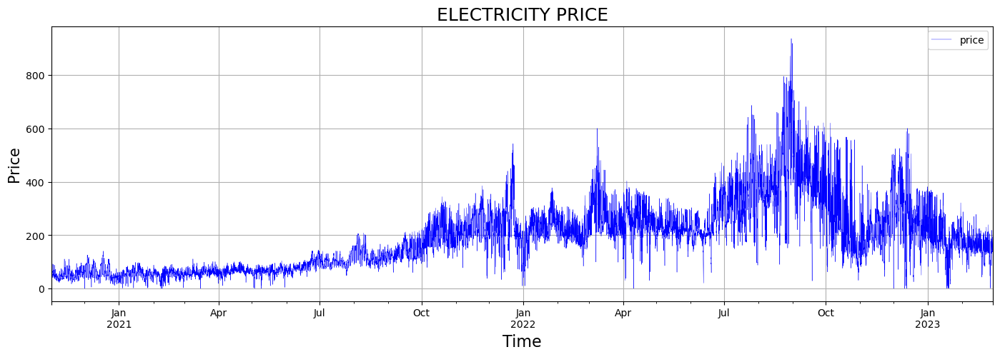

In [6]:
maindata.plot(style='-', figsize=(17,5), color='blue', linewidth=0.3)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Price', fontsize = 15)
plt.title('ELECTRICITY PRICE', fontsize= 18)
plt.grid()
plt.show()

## fill NaN

In [7]:
np.where(np.isnan(maindata))

(array([ 3551, 12287], dtype=int64), array([0, 0], dtype=int64))

In [8]:
maindata.iloc[3551] = maindata.iloc[3551-168]

In [9]:
maindata.iloc[12287] = maindata.iloc[12287-168]

In [10]:
np.where(np.isnan(maindata))

(array([], dtype=int64), array([], dtype=int64))

## Hourly data

In [11]:
maindata[maindata==0] = 0.01
data = maindata.resample('H').mean()

In [12]:
len(data)

20400

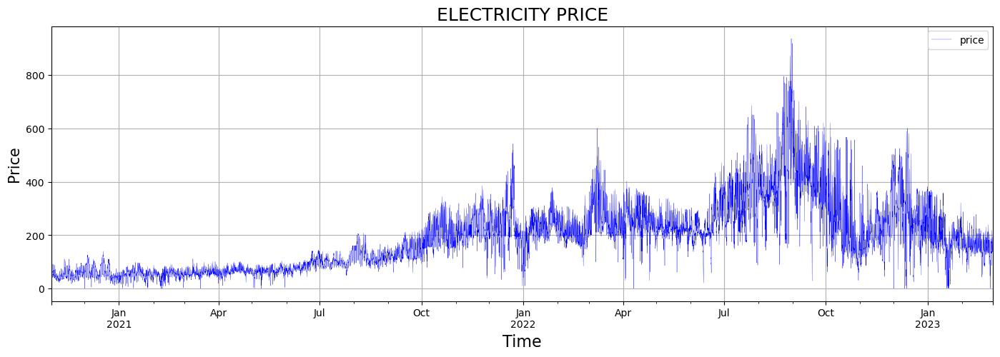

In [13]:
data.plot(style='-', figsize=(17,5), color='blue', linewidth=0.2)
plt.xlabel('Time', fontsize = 16)
plt.ylabel('Price', fontsize = 15)
plt.title('ELECTRICITY PRICE', fontsize= 18)
plt.grid()
plt.show()

## cross validation

In [14]:
cv= ExpandingWindowSplitter(initial_window = 20360, fh= np.arange(1,25))

## split train-test data

In [15]:
train,test = temporal_train_test_split(data,test_size=40)

# FORECASTERS

## SEASONAL NAIVE FORECASTER

In [16]:
snforecaster = NaiveForecaster('last', sp = 12)
snforecaster.fit(train)

NaiveForecaster(sp=12)

## residuals

In [17]:
snresid = snforecaster.predict_residuals(train)

In [66]:
residuals_plots(snresid.dropna())

## forecast

In [19]:
cv_seasonalnaive1 = evaluate(strategy='refit', forecaster=snforecaster, cv=cv, y=data, return_data=True, scoring=MeanSquaredError(square_root=True))
cv_seasonalnaive2 = evaluate(strategy='refit', forecaster=snforecaster, cv=cv, y=data, return_data=True, scoring=None)
cv_seasonalnaive3 = evaluate(strategy='refit', forecaster=snforecaster, cv=cv, y=data, return_data=True, scoring=MeanAbsoluteError())

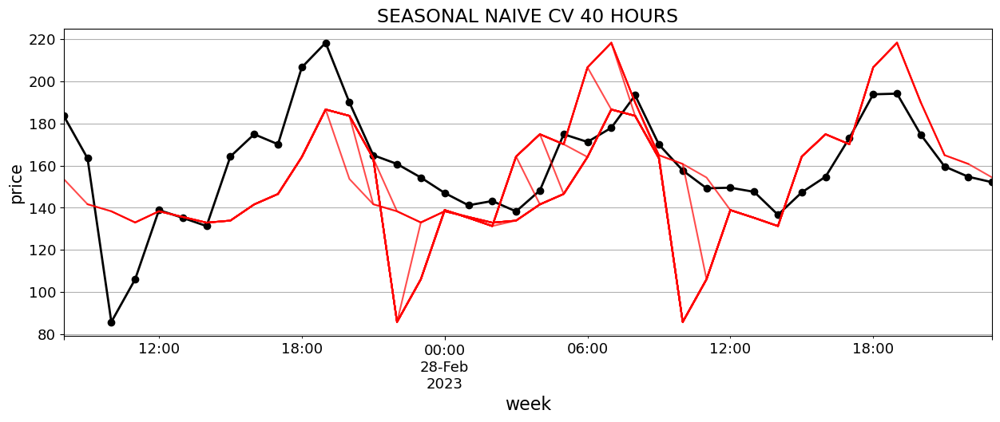

In [20]:
ax = data.iloc[-40:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_seasonalnaive1)):
  cv_seasonalnaive1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha= .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('SEASONAL NAIVE CV 40 HOURS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [21]:
snRMSEtrain = np.sqrt(np.square(snresid['price']).mean())
snMAPEtrain = np.absolute(snresid['price']).mean()
snMAEtrain = np.absolute(snresid['price']/train['price']).mean()

## test metrics

In [22]:
snRMSEtest =np.sqrt(cv_seasonalnaive1["test_MeanSquaredError"]).mean()
snMAPEtest = cv_seasonalnaive2["test_MeanAbsolutePercentageError"].mean()
snMAEtest = cv_seasonalnaive3["test_MeanAbsoluteError"].mean()

## ARIMA FORECASTER

## orders selection

In [23]:
datad = data.diff().diff(12).dropna()
ADFtest(datad)

is stationary


In [24]:
fig = plt.figure(figsize=(5.5, 3.5), layout="constrained")
spec = fig.add_gridspec(2, 2)

#diff logged data
ax1 = fig.add_subplot(spec[0, :])
datad.plot(style='-', figsize=(80,80), color='blue', linewidth=3, ax = ax1)
ax1.set_xlabel('Time', fontsize = 80)
ax1.xaxis.set_tick_params(labelsize=80)
ax1.set_ylabel('diff price', fontsize = 80)
ax1.yaxis.set_tick_params(labelsize=80)
ax1.set_title('DIFF DATA', fontsize= 90)
ax1.legend().set_visible(False)
ax1.grid(linewidth=6)
ax1.spines['top'].set_linewidth(3)
ax1.spines['right'].set_linewidth(3)
ax1.spines['left'].set_linewidth(3)
ax1.spines['bottom'].set_linewidth(3)

#acf plot
ax2 = fig.add_subplot(spec[1, 0])
plot_acf(datad,zero=False, ax=ax2, lags= None, linewidth = 10, vlines_kwargs={"linewidth": 10})
ax2.set_ylim([-0.7,0.7])
ax2.xaxis.set_tick_params(labelsize=80)
ax2.yaxis.set_tick_params(labelsize=80)
ax2.set_title('AUTOCORRELATION', fontsize= 90)
ax2.spines['top'].set_linewidth(3)
ax2.spines['right'].set_linewidth(3)
ax2.spines['left'].set_linewidth(3)
ax2.spines['bottom'].set_linewidth(3)

#pacf plot
ax3 = fig.add_subplot(spec[1, 1])
plot_pacf(datad,zero=False, ax=ax3, lags = None, linewidth = 10, vlines_kwargs={"linewidth": 10})
ax3.set_ylim([-0.7,0.7])
ax3.xaxis.set_tick_params(labelsize=80)
ax3.yaxis.set_tick_params(labelsize=80)
ax3.set_title('PARTIAL AUTOCORRELATION', fontsize= 90)
ax3.spines['top'].set_linewidth(3)
ax3.spines['right'].set_linewidth(3)
ax3.spines['left'].set_linewidth(3)
ax3.spines['bottom'].set_linewidth(3)

fig.tight_layout(pad=10)
plt.show()

In [25]:
aforecaster = ARIMA(order = (4,1,4), seasonal_order= (1,1,1,12),)
aforecaster.fit(train)

ARIMA(order=(4, 1, 4), seasonal_order=(1, 1, 1, 12))

In [26]:
aforecaster.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                20360
Model:             SARIMAX(4, 1, 4)x(1, 1, [1], 12)   Log Likelihood              -97794.744
Date:                              Sat, 01 Jul 2023   AIC                         195613.488
Time:                                      07:44:30   BIC                         195708.537
Sample:                                  11-01-2020   HQIC                        195644.559
                                       - 02-27-2023                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   -2.39e-05   1.77e-05     -1.353      0.176   -5.85e-05    1.07e-05
ar.L1         -1.1408      0.167     -6.845      0.000      -1.468      -0.814
ar.L2          0.0855      0.055      1.557      0.120      -0.022       0.193
ar.L3          1.1186      0.066     16.933      0.000       0.989       1.248
ar.L4          0.7660      0.133      5.771      0.000       0.506       1.026
ma.L1          1.1181      0.166      6.745      0.000       0.793       1.443
ma.L2         -0.1600      0.053     -3.017      0.003      -0.264      -0.056
ma.L3         -1.1774      0.075    -15.765      0.000      -1.324      -1.031
ma.L4         -0.7794      0.133     -5.846      0.000      -1.041      -0.518
ar.S.L12      -0.0433      0.007     -6.117      0.000      -0.057      -0.029
ma.S.L12      -0.9910      0.001  -1966.215      0.000      -0.992      -0.990
sigma2      1318.4254      8.244    159.924      0.000    1302.267    1334.584
===================================================================================
Ljung-Box (L1) (Q):                  83.59   Jarque-Bera (JB):            246028.79
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):              31.50   Skew:                             0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                        20.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## residuals

In [27]:
aresid = aforecaster.predict_residuals(train)

In [28]:
residuals_plots(aresid.dropna())

## forecast

In [29]:
cv_arima1 = evaluate(strategy='refit', forecaster=aforecaster, cv=cv, y=data, return_data=True, scoring=MeanSquaredError(square_root=True))
cv_arima2 = evaluate(strategy='refit', forecaster=aforecaster, cv=cv, y=data, return_data=True, scoring = None)
cv_arima3 = evaluate(strategy='refit', forecaster=aforecaster, cv=cv, y=data, return_data=True, scoring = MeanAbsoluteError())

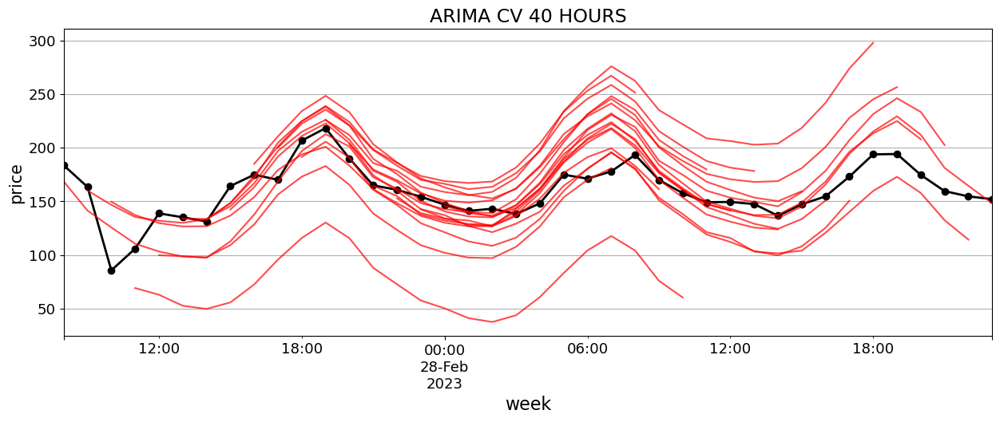

In [30]:
ax = data.iloc[-40:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_arima1)):
  cv_arima1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha= .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('ARIMA CV 40 HOURS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [31]:
aRMSEtrain = np.sqrt(np.square(aresid['price']).mean())
aMAPEtrain = np.absolute(aresid['price']).mean()
aMAEtrain = np.absolute(aresid['price']/train['price']).mean()

## test metrics

In [32]:
aRMSEtest = np.sqrt(cv_arima1["test_MeanSquaredError"]).mean()
aMAPEtest = cv_arima2["test_MeanAbsolutePercentageError"].mean()
aMAEtest = cv_arima3["test_MeanAbsoluteError"].mean()

## AUTOARIMA FORECASTER

## orders selection

In [16]:
autoforecaster = AutoARIMA(sp =12 , D =1, d=1, n_jobs=-1)

In [17]:
autoforecaster.fit(data)

MemoryError: Unable to allocate 262. MiB for an array with shape (20401, 41, 41) and data type float64

In [ ]:
autoforecaster.summary()

In [33]:
aaforecaster = ARIMA(order = (1,1,0), seasonal_order = (2,1,0,12), with_intercept=False)
aaforecaster.fit(train)

ARIMA(order=(1, 1, 0), seasonal_order=(2, 1, 0, 12), with_intercept=False)

## residuals

In [34]:
aaresid = aaforecaster.predict_residuals(train)

In [68]:
residuals_plots(aaresid.dropna())

## forecast

In [36]:
cv_autoarima1 = evaluate(strategy='refit',forecaster=aaforecaster,cv=cv,y=data,return_data=True,scoring=MeanSquaredError(square_root=True))
cv_autoarima2 = evaluate(strategy='refit',forecaster=aaforecaster,cv=cv,y=data,return_data=True, scoring = None)
cv_autoarima3 = evaluate(strategy='refit',forecaster=aaforecaster,cv=cv,y=data,return_data=True, scoring = MeanAbsoluteError())

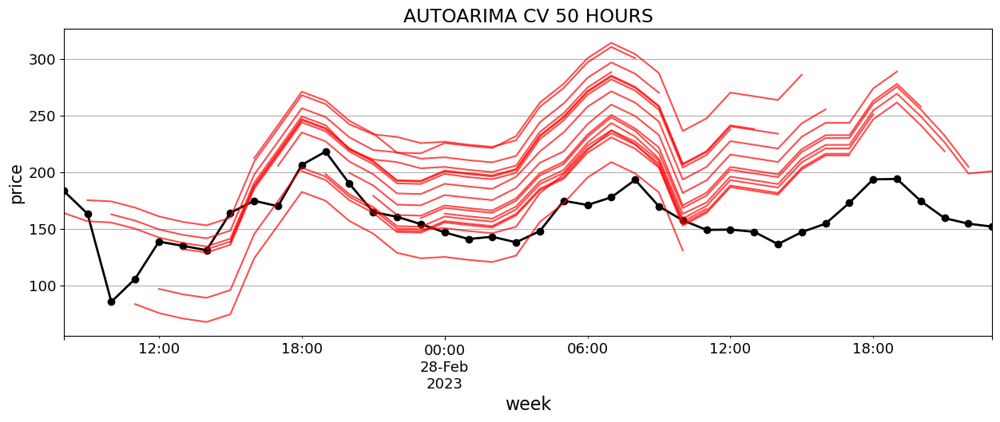

In [37]:
ax = data.iloc[-40:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_autoarima1)):
  cv_autoarima1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha= .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('AUTOARIMA CV 50 HOURS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [38]:
aaRMSEtrain = np.sqrt(np.square(aaresid['price']).mean())
aaMAPEtrain = np.absolute(aaresid['price']).mean()
aaMAEtrain = np.absolute(aaresid['price']/train['price']).mean()

## test metrics

In [39]:
aaRMSEtest = np.sqrt(cv_autoarima1["test_MeanSquaredError"]).mean()
aaMAPEtest = cv_autoarima2["test_MeanAbsolutePercentageError"].mean()
aaMAEtest = cv_autoarima3["test_MeanAbsoluteError"].mean()

## EXPONENTIAL SMOOTHING FORECASTER

In [40]:
esforecaster = ExponentialSmoothing(trend="add", seasonal="additive", sp=12)
esforecaster.fit(train)

ExponentialSmoothing(seasonal='additive', sp=12, trend='add')

## residuals

In [41]:
esresid = esforecaster.predict_residuals(train)

In [19]:
residuals_plots(esresid)

## forecast

In [42]:
cv_ETS1 = evaluate(strategy='refit',forecaster=esforecaster,cv=cv,y=data,return_data=True,scoring=MeanSquaredError(square_root=True))
cv_ETS2 = evaluate(strategy='refit',forecaster=esforecaster,cv=cv,y=data,return_data=True, scoring= None)
cv_ETS3 = evaluate(strategy='refit',forecaster=esforecaster,cv=cv,y=data,return_data=True, scoring= MeanAbsoluteError())

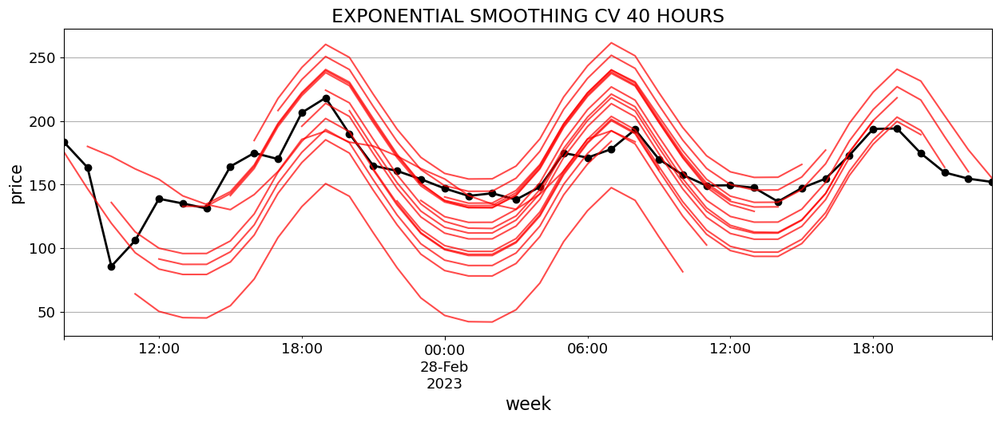

In [23]:
ax = data.iloc[-40:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_ETS1)):
  cv_ETS1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha = .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('EXPONENTIAL SMOOTHING CV 40 HOURS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [43]:
esRMSEtrain = np.sqrt(np.square(esresid['price']).mean())
esMAPEtrain = np.absolute(esresid['price']).mean()
esMAEtrain = np.absolute(esresid['price']/train['price']).mean()

## test metrics

In [44]:
esRMSEtest = np.sqrt(cv_ETS1["test_MeanSquaredError"]).mean()
esMAPEtest = cv_ETS2["test_MeanAbsolutePercentageError"].mean()
esMAEtest = cv_ETS3["test_MeanAbsoluteError"].mean()

## NEUTRAL NETWORKS

## forecasting grid search

In [22]:
y_train, y_test = temporal_train_test_split(data, test_size=40)

In [23]:
cv1= ExpandingWindowSplitter(initial_window = 20320, fh= np.arange(1,25), step_length = 1)

In [24]:
lst = []
k_values = range(300,501,100)
for k in k_values:
    lst.append(k,)
i_values = range(300,501,100)
j_values = range(300,501,100)
for i in i_values:
    for j in j_values:
        lst.append((i,j))

In [25]:
parameters= {'estimator__hidden_layer_sizes': lst,
         'estimator__early_stopping': [True, False],
             'estimator__shuffle': [True, False],
             'window_length': [168,336]}

In [26]:
regressor = MLPRegressor(random_state=11, max_iter = 200)
forecaster = make_reduction(estimator = regressor, strategy='recursive')

In [27]:
grid_search = ForecastingGridSearchCV(forecaster = forecaster, cv=cv1, n_jobs =-1, param_grid = parameters, scoring=MeanSquaredError(square_root=True))

In [28]:
grid_search.fit(y_train)

ForecastingGridSearchCV(cv=ExpandingWindowSplitter(fh=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24]),
                                                   initial_window=20320),
                        forecaster=RecursiveTabularRegressionForecaster(estimator=MLPRegressor(random_state=11)),
                        n_jobs=-1,
                        param_grid={'estimator__early_stopping': [True, False],
                                    'estimator__hidden_layer_sizes': [300, 400,
                                                                      500,
                                                                      (300,
                                                                       300),
                                                                      (300,
                                                                       400),
                                                                      

In [29]:
grid_search.best_params_

{'estimator__early_stopping': True,
 'estimator__hidden_layer_sizes': 500,
 'estimator__shuffle': False,
 'window_length': 168}

In [45]:
model = MLPRegressor(max_iter=500, hidden_layer_sizes=(500), random_state= 11, shuffle=False, early_stopping=True)
nnforecaster = make_reduction(estimator = model, strategy='recursive', window_length=168)
nnforecaster.fit(train)

RecursiveTabularRegressionForecaster(estimator=MLPRegressor(early_stopping=True,
                                                            hidden_layer_sizes=500,
                                                            max_iter=500,
                                                            random_state=11,
                                                            shuffle=False),
                                     window_length=168)

## residuals

In [46]:
nnresid = nn_residuals(168,MLPRegressor(max_iter=500, hidden_layer_sizes=(500,), random_state= 11, shuffle=False, early_stopping=True))

In [47]:
nnresid = pd.DataFrame(nnresid, train.index)

In [48]:
nnresid = nnresid.rename(columns = {0:'price'})

In [45]:
residuals_plots(nnresid.dropna())

## forecast

In [49]:
cv_nn1 = evaluate(strategy='refit',forecaster=nnforecaster,cv=cv,y=data, return_data=True, scoring=MeanSquaredError(square_root=True), n_jobs =-1)
cv_nn2 = evaluate(strategy='refit',forecaster=nnforecaster,cv=cv,y=data, return_data=True, n_jobs =-1)
cv_nn3 = evaluate(strategy='refit',forecaster=nnforecaster,cv=cv,y=data, return_data=True, scoring=MeanAbsoluteError(), n_jobs =-1)

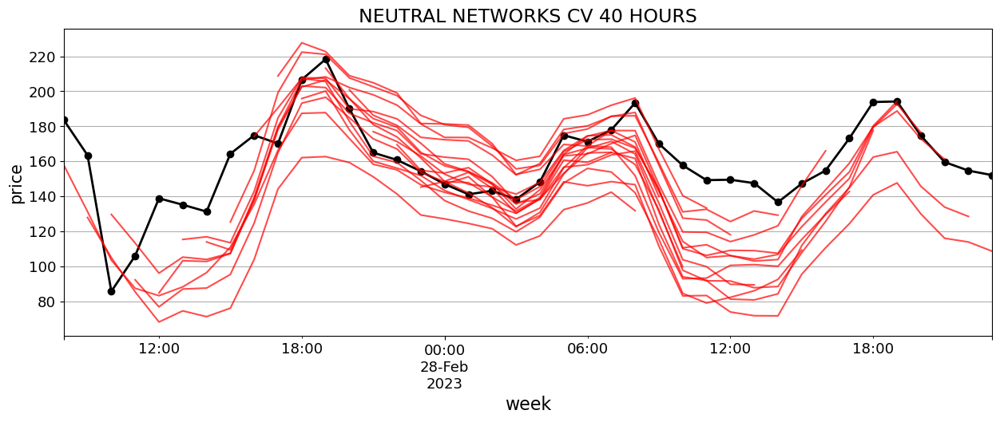

In [36]:
ax = data.iloc[-40:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_nn1)):
  cv_nn1['y_pred'].iloc[i].plot(ax=ax,color='red', alpha = .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('NEUTRAL NETWORKS CV 40 HOURS', fontsize = 17)
plt.grid(axis = 'y')
plt.show()

## train metrics

In [50]:
nnRMSEtrain = np.sqrt(np.square(nnresid['price']).mean())
nnMAPEtrain = np.absolute(nnresid['price']).mean()
nnMAEtrain = np.absolute(nnresid['price']/train['price']).mean()

## test metrics

In [51]:
nnRMSEtest = np.sqrt(cv_nn1["test_MeanSquaredError"]).mean()
nnMAPEtest = cv_nn2["test_MeanAbsolutePercentageError"].mean()
nnMAEtest = cv_nn3["test_MeanAbsoluteError"].mean()

## ENSEMBLE FORECASTER

In [52]:
estimator = MLPRegressor(max_iter=500, hidden_layer_sizes=(500,), random_state= 11, shuffle=False, early_stopping=True)
model1 = make_reduction(estimator = estimator, strategy='recursive', window_length=168)
model2 = ExponentialSmoothing(trend="add", seasonal="additive", sp=12)
model3 = ARIMA(order = (4,1,4), seasonal_order= (1,1,1,12))
model4 = NaiveForecaster('last', sp = 12)
model5 = ARIMA(order = (1,0,0), seasonal_order= (2,1,0,12))
forecasters = [('neural networks',model1),('Exponential smoothing',model2),('ARIMA',model3),('seasonal naive',model4),('AutoArRIMA',model5)]
enforecaster = EnsembleForecaster(forecasters=forecasters, n_jobs=-1)
enforecaster.fit(train)

EnsembleForecaster(forecasters=[('neural networks',
                                 RecursiveTabularRegressionForecaster(estimator=MLPRegressor(early_stopping=True,
                                                                                             hidden_layer_sizes=(500,),
                                                                                             max_iter=500,
                                                                                             random_state=11,
                                                                                             shuffle=False),
                                                                      window_length=168)),
                                ('Exponential smoothing',
                                 ExponentialSmoothing(seasonal='additive',
                                                      sp=12, trend='add')),
                                ('ARIMA',
                                 ARIMA(order=(

## residuals

In [53]:
enresid = (snresid + aresid + aaresid + esresid + nnresid)/5

In [54]:
residuals_plots(enresid.dropna())

## forecast

In [55]:
cv_ensemble1 = evaluate(strategy='refit',forecaster=enforecaster,cv=cv,y=data, return_data=True, scoring=MeanSquaredError(square_root=True))
cv_ensemble2 = evaluate(strategy='refit',forecaster=enforecaster,cv=cv,y=data, return_data=True)
cv_ensemble3 = evaluate(strategy='refit',forecaster=enforecaster,cv=cv,y=data, return_data=True, scoring=MeanAbsoluteError())

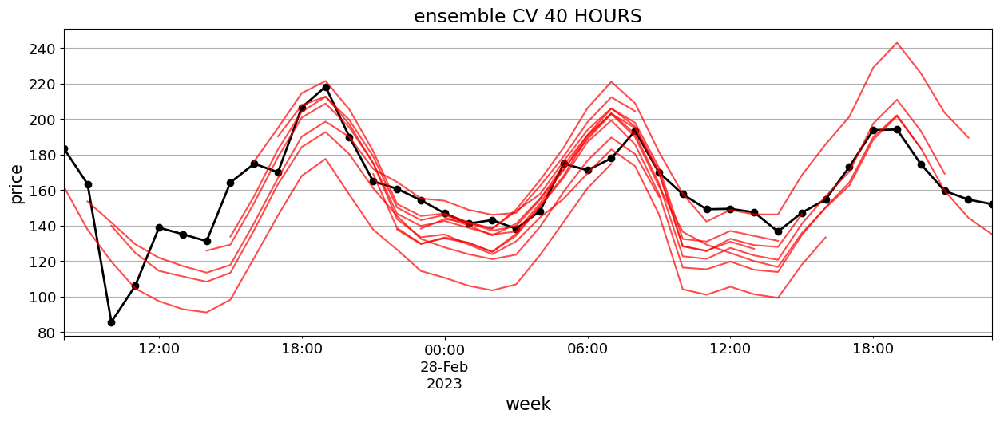

In [75]:
ax = data.iloc[-40:].plot(color='black',marker='o', figsize=(15,5), linewidth=2, fontsize = 13)
for i in range(len(cv_ensemble1.dropna())):
  cv_ensemble1['y_pred'].dropna().iloc[i].plot(ax=ax,color='red', alpha = .7)
ax.get_legend().remove()
plt.xlabel('week', fontsize = 16)
plt.ylabel('price', fontsize = 15)
plt.title('ensemble CV 40 HOURS', fontsize = 17)
plt.grid(axis = 'y')

plt.show()

## train metrics

In [57]:
enRMSEtrain = np.sqrt(np.square(enresid['price'].dropna()).mean())
enMAPEtrain = np.absolute(enresid['price'].dropna()).mean()
enMAEtrain = np.absolute(enresid['price'].dropna()/train['price'].dropna()).mean()

## test metrics

In [58]:
enRMSEtest = np.sqrt(cv_ensemble1["test_MeanSquaredError"].dropna()).mean()
enMAPEtest = cv_ensemble2["test_MeanAbsolutePercentageError"].dropna().mean()
enMAEtest = cv_ensemble3["test_MeanAbsoluteError"].dropna().mean()

## TOTAL METRICS 

## train metrics

In [59]:
names = ('Hourly Seasonal naive forecaster','Hoyrly ARIMA forecaster', 'Hourly AUTOARIMA forecaster','Hourly exponential smoothing forecaster', 'Hourly neutral network', 'Hourly ensemble') 
values = {'RMSE': [snRMSEtrain, aRMSEtrain, aaRMSEtrain, esRMSEtrain, nnRMSEtrain, enRMSEtrain], 'MAPE': [snMAPEtrain, aMAPEtrain, aaMAPEtrain, esMAPEtrain, nnMAPEtrain, enMAPEtrain], 'MAE': [snMAEtrain, aMAEtrain, aaMAEtrain, esMAEtrain, nnMAEtrain, enMAEtrain]}
metrics = pd.DataFrame(values, names)
metrics = metrics.sort_values(by=['RMSE'])
metrics.style.highlight_min()

,RMSE,MAPE,MAE
Hourly neutral network,23.570941,13.726671,3.975602
Hoyrly ARIMA forecaster,27.832985,15.660787,3.126373
Hourly exponential smoothing forecaster,28.778029,16.673021,3.065604
Hourly ensemble,28.963302,17.335776,5.495740
Hourly AUTOARIMA forecaster,29.880458,17.033175,3.022694
Hourly Seasonal naive forecaster,77.580350,48.089993,15.192838


## test metrics

In [60]:
names = ('Hourly seasonal naive forecaster','Hourly ARIMA forecaster', 'Hourly AUTOARIMA forecaster','Hourly exponential smoothing forecaster', 'Hourly neutral network', 'Hourly ensemble') 
values = {'RMSE': [snRMSEtest, aRMSEtest, aaRMSEtest, esRMSEtest, nnRMSEtest, enRMSEtest], 'MAPE': [snMAPEtest, aMAPEtest, aaMAPEtest, esMAPEtest, nnMAPEtest, enMAPEtest], 'MAE': [snMAEtest, aMAEtest, aaMAEtest, esMAEtest, nnMAEtest, enMAEtest]}
metrics = pd.DataFrame(values, names)
metrics = metrics.sort_values(by=['RMSE'])
metrics.style.highlight_min()

,RMSE,MAPE,MAE
Hourly ensemble,4.472277,0.149919,46.913204
Hourly seasonal naive forecaster,5.212775,0.126323,20.205931
Hourly ARIMA forecaster,5.503106,0.171743,27.489949
Hourly neutral network,5.588084,0.163857,25.719603
Hourly exponential smoothing forecaster,5.595731,0.174576,27.464389
Hourly AUTOARIMA forecaster,7.337014,0.307924,48.825407
